### 모델 다운로드

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [2]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -qr requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 11668, done.
remote: Total 11668 (delta 0), reused 0 (delta 0), pack-reused 11668
Receiving objects: 100% (11668/11668), 11.35 MiB | 18.30 MiB/s, done.
Resolving deltas: 100% (8070/8070), done.
/content/yolov5
     |████████████████████████████████| 596 kB 7.1 MB/s 


In [3]:
from glob import glob
import os
train_dir = os.path.join('/content', 'drive/MyDrive/Code_States/Section4/train')
test_dir = os.path.join('/content', 'drive/MyDrive/Code_States/Section4/test')
#이미지 리스트를 저장해줍니다.
train_img_list = glob(os.path.join(train_dir,'images/*.jpg'))
test_img_list = glob(os.path.join(test_dir,'images/*.jpg'))
print(len(train_img_list), len(test_img_list))

16410 3598


In [4]:
from sklearn.model_selection import train_test_split

train_img_list, val_img_list = train_test_split(train_img_list, test_size= 0.25, random_state=777)
print(len(train_img_list), len(val_img_list))

12307 4103


In [5]:
#모든 훈련 이미지의 경로가 리스트로 저정되어 있는 것을 확인할 수 있습니다.
train_img_list[:5]

['/content/drive/MyDrive/Code_States/Section4/train/images/image_36164830816865.jpg',
 '/content/drive/MyDrive/Code_States/Section4/train/images/image_30522987415140.jpg',
 '/content/drive/MyDrive/Code_States/Section4/train/images/image_91879118251899.jpg',
 '/content/drive/MyDrive/Code_States/Section4/train/images/image_65061820371109.jpg',
 '/content/drive/MyDrive/Code_States/Section4/train/images/image_62192076037847.jpg']

In [6]:
#위 이미지의 경로들을 저장하는 텍스트 파일을 만들어 저장합시다.
import yaml

with open(os.path.join(train_dir, 'train.txt'), 'w') as f:
  f.write('\n'.join(train_img_list) + '\n')

with open(os.path.join(train_dir, 'val.txt'), 'w') as f:
  f.write('\n'.join(val_img_list) + '\n')

with open(os.path.join(test_dir, 'test.txt'), 'w') as f:
  f.write('\n'.join(test_img_list) + '\n')

In [7]:
#IPython에서 문장입력해서 텍스트로 사용하려면 필요한 magic
from IPython.core.magic import register_line_cell_magic

@register_line_cell_magic
def writetemplate(line,cell):
  with open(line, 'w') as f:
    f.write(cell.format(**globals()))

In [8]:
#yaml파일을 확인해줍니다.
yaml_path = '/content/drive/MyDrive//Code_States/Section4/train/data.yaml'
%cat /content/drive/MyDrive//Code_States/Section4/train/data.yaml

train: /content/drive/MyDrive/Code_States/Section4/train/images
val: /content/drive/MyDrive/Code_States/Section4/train/images
test: /content/drive/MyDrive/Code_States/Section4/test/images

nc: 7
names: ['face', 'eye_opened', 'eye_closed', 'mouth_opened', 'mouth_closed', 'cigar', 'phone']

### 모델 구성

In [9]:
#기존 yolov5 모델을 불러옵니다.
import yaml

with open(yaml_path, 'r') as stream:
  num_classes = str(yaml.safe_load(stream)['nc'])

%cat /content/yolov5/models/yolov5s.yaml

# YOLOv5 🚀 by Ultralytics, GPL-3.0 license

# Parameters
nc: 80  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]]

In [10]:
#가져온 모델을 custom 합니다
%%writetemplate /content/yolov5/models/custom_yolov5s.yaml

# Parameters
nc: {num_classes}  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, False]],  # 17 (P3/8-small)

   [-1, 1, Conv, [256, 3, 2]],
   [[-1, 14], 1, Concat, [1]],  # cat head P4
   [-1, 3, C3, [512, False]],  # 20 (P4/16-medium)

   [-1, 1, Conv, [512, 3, 2]],
   [[-1, 10], 1, Concat, [1]],  # cat head P5
   [-1, 3, C3, [1024, False]],  # 23 (P5/32-large)

   [[17, 20, 23], 1, Detect, [nc, anchors]],  # Detect(P3, P4, P5)
  ]

In [11]:
%cat /content/yolov5/models/custom_yolov5s.yaml


# Parameters
nc: 7  # number of classes
depth_multiple: 0.33  # model depth multiple
width_multiple: 0.50  # layer channel multiple
anchors:
  - [10,13, 16,30, 33,23]  # P3/8
  - [30,61, 62,45, 59,119]  # P4/16
  - [116,90, 156,198, 373,326]  # P5/32

# YOLOv5 v6.0 backbone
backbone:
  # [from, number, module, args]
  [[-1, 1, Conv, [64, 6, 2, 2]],  # 0-P1/2
   [-1, 1, Conv, [128, 3, 2]],  # 1-P2/4
   [-1, 3, C3, [128]],
   [-1, 1, Conv, [256, 3, 2]],  # 3-P3/8
   [-1, 6, C3, [256]],
   [-1, 1, Conv, [512, 3, 2]],  # 5-P4/16
   [-1, 9, C3, [512]],
   [-1, 1, Conv, [1024, 3, 2]],  # 7-P5/32
   [-1, 3, C3, [1024]],
   [-1, 1, SPPF, [1024, 5]],  # 9
  ]

# YOLOv5 v6.0 head
head:
  [[-1, 1, Conv, [512, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 6], 1, Concat, [1]],  # cat backbone P4
   [-1, 3, C3, [512, False]],  # 13

   [-1, 1, Conv, [256, 1, 1]],
   [-1, 1, nn.Upsample, [None, 2, 'nearest']],
   [[-1, 4], 1, Concat, [1]],  # cat backbone P3
   [-1, 3, C3, [256, Fa

In [ ]:
#모델 훈련
%time
%cd /content/yolov5
!python train.py --img 416 --batch 64 --epochs 50 --data ../drive/MyDrive/Code_States/Section4/train/data.yaml --cfg ./models/custom_yolov5s.yaml --weight '' --name driver_results --cache

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 5.96 µs
/content/yolov5
train: weights=, cfg=./models/custom_yolov5s.yaml, data=../drive/MyDrive/Code_States/Section4/train/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=50, batch_size=64, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, optimizer=SGD, sync_bn=False, workers=8, project=runs/train, name=driver_results, exist_ok=False, quad=False, cos_lr=False, label_smoothing=0.0, patience=100, freeze=[0], save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.1-39-g4effd06 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

hyperparameters: lr0=0.01, lrf=0.01, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, bo

In [ ]:
%load_ext tensorboard
%tensorboard --logdir runs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
!ls runs/train/driver_results

confusion_matrix.png				    results.png
events.out.tfevents.1647692966.1a288d976733.1166.0  train_batch0.jpg
F1_curve.png					    train_batch1.jpg
hyp.yaml					    train_batch2.jpg
labels_correlogram.jpg				    val_batch0_labels.jpg
labels.jpg					    val_batch0_pred.jpg
opt.yaml					    val_batch1_labels.jpg
P_curve.png					    val_batch1_pred.jpg
PR_curve.png					    val_batch2_labels.jpg
R_curve.png					    val_batch2_pred.jpg
results.csv					    weights


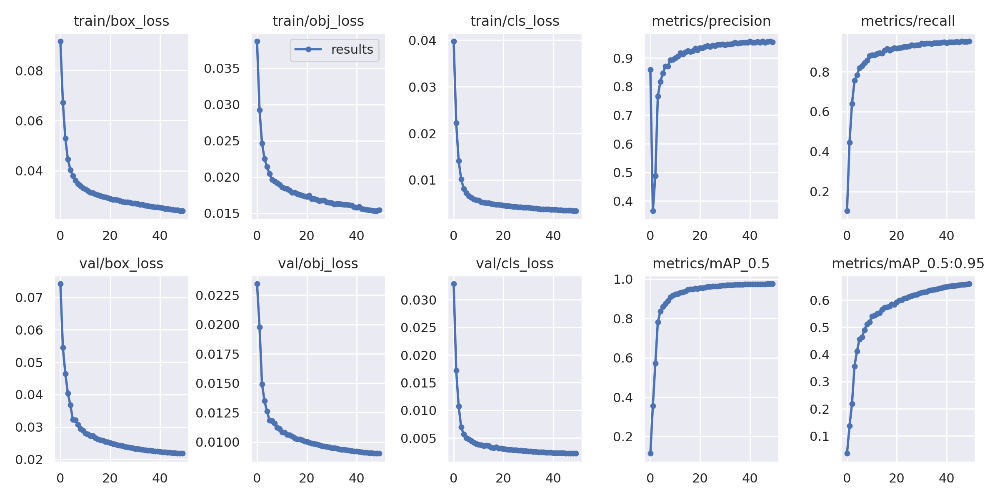

In [ ]:
from keras.preprocessing import image
from IPython.display import Image
Image(filename='runs/train/driver_results/results.png', width=1000)

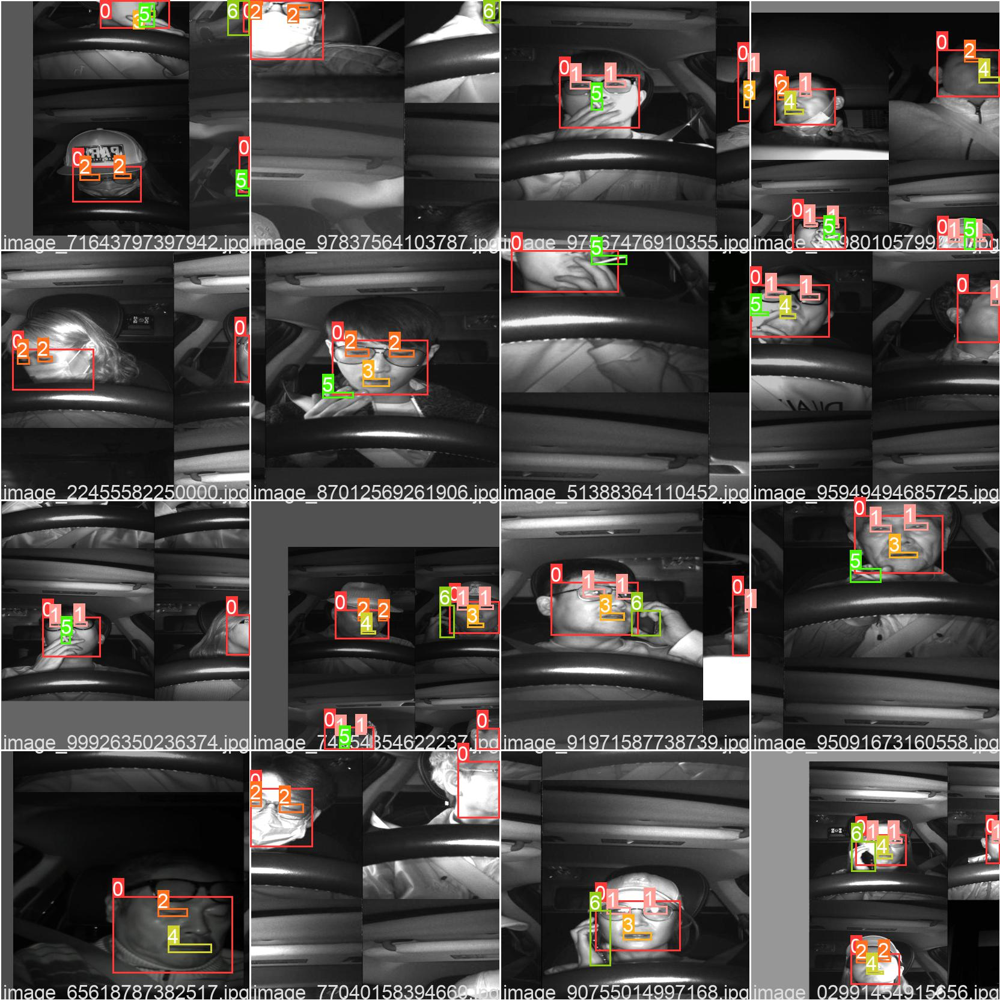

In [ ]:
Image(filename='runs/train/driver_results/train_batch0.jpg', width=1000)

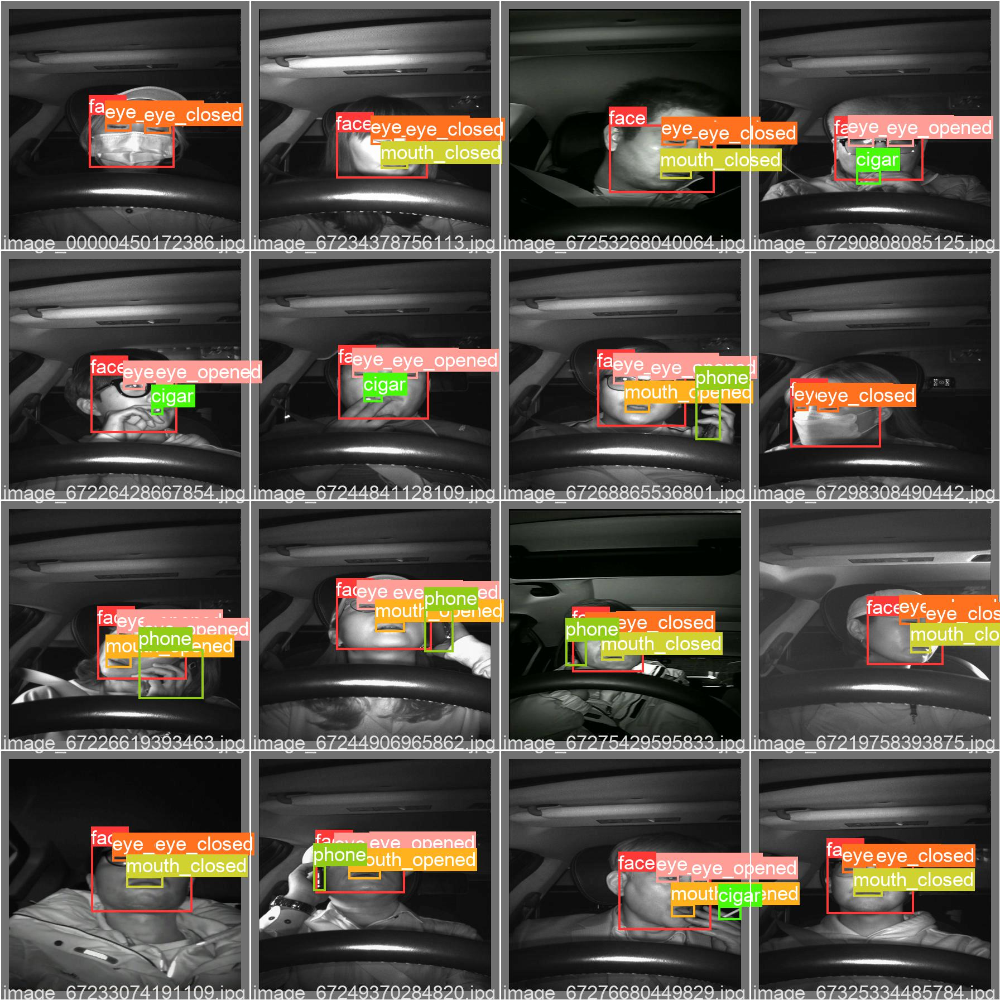

In [ ]:
Image(filename='runs/train/driver_results/val_batch0_labels.jpg', width=1000)

In [ ]:
!python val.py --weights runs/train/driver_results/weights/best.pt --data /content/drive/MyDrive/Code_States/Section4/train/data.yaml --img 416 --iou 0.65 --half

val: data=/content/drive/MyDrive/Code_States/Section4/train/data.yaml, weights=['runs/train/driver_results3/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.65, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=True, dnn=False
YOLOv5 🚀 v6.1-39-g4effd06 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 213 layers, 7029004 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning '/content/drive/MyDrive/Code_States/Section4/train/labels.cache' images and labels... 16409 found, 1 missing, 0 empty, 0 corrupt: 100% 16410/16410 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95: 100% 513/513 [01:46<00:00,  4.80it/s]
                 all      16410      70544      0.957      0.948      0.975      0.659
                face      16410   

In [ ]:
!python val.py --weights runs/train/driver_results/weights/best.pt --data /content/drive/MyDrive/Code_States/Section4/train/data.yaml --img 416 --task test

val: data=/content/drive/MyDrive/Code_States/Section4/train/data.yaml, weights=['runs/train/driver_results2/weights/best.pt'], batch_size=32, imgsz=416, conf_thres=0.001, iou_thres=0.6, task=test, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
YOLOv5 🚀 v6.1-39-g4effd06 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 213 layers, 7029004 parameters, 0 gradients, 15.9 GFLOPs
test: Scanning '/content/drive/MyDrive/Code_States/Section4/test/labels.cache' images and labels... 0 found, 3598 missing, 0 empty, 0 corrupt: 100% 3598/3598 [00:00<?, ?it/s]
               Class     Images     Labels          P          R     mAP@.5 mAP@.5:.95:   7% 8/113 [00:40<08:55,  5.10s/it]
Traceback (most recent call last):
  File "val.py", line 381, in <module>
    main(opt)
  File "val.py", line 354, in main
  

In [ ]:
%ls runs/train/driver_results/weights

best.pt  last.pt


In [ ]:
!python detect.py --weights runs/train/driver_results3/weights/best.pt --img 416 --conf 0.4 --source /content/drive/MyDrive/Code_States/Section4/test/images

detect: weights=['runs/train/driver_results3/weights/best.pt'], source=/content/drive/MyDrive/Code_States/Section4/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-39-g4effd06 torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 213 layers, 7029004 parameters, 0 gradients, 15.9 GFLOPs
image 1/3598 /content/drive/MyDrive/Code_States/Section4/test/images/image_00010850976733.jpg: 416x288 1 face, 1 eye_opened, 1 mouth_opened, 1 phone, Done. (0.011s)
image 2/3598 /content/drive/MyDrive/Code_States/Section4/test/images/image_00027919888209.jpg: 416x288 1 face, 2 eye_openeds, 1 mouth_opened, 1 phone, 

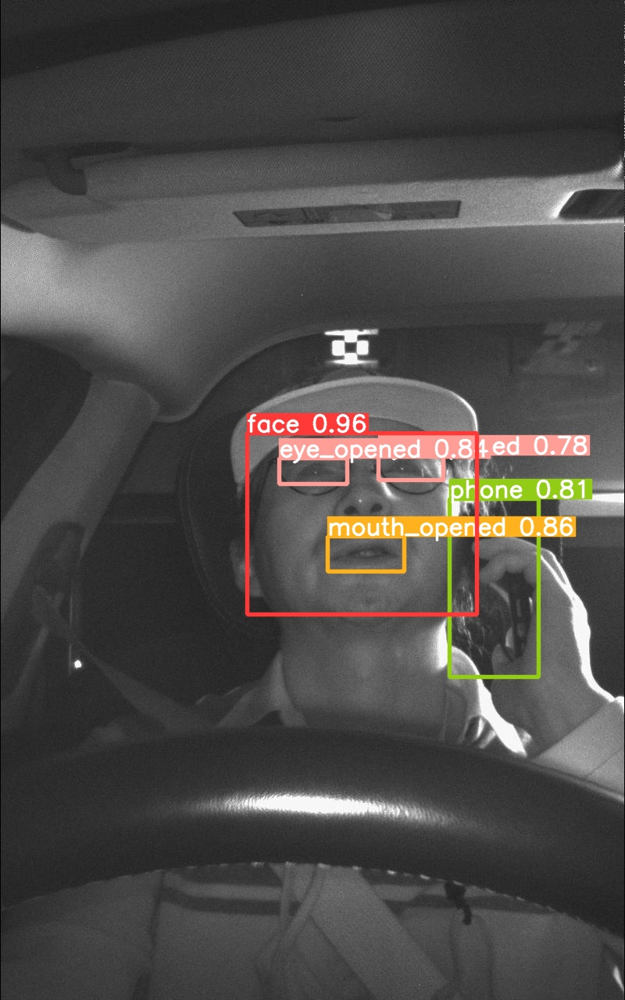

In [ ]:
import glob
import random
image_name = random.choice(glob.glob('runs/detect/exp2/*.jpg'))
display(Image(filename=image_name))

In [ ]:
%mkdir /content/drive/MyDrive/Code_States/Section4/driver
%cp runs/train/driver_results3/weights/best.pt /content/drive/MyDrive/Code_States/Section4/driver/best.pt

mkdir: cannot create directory ‘/content/drive/MyDrive/Code_States/Section4/driver’: File exists


In [12]:
!python detect.py --weights /content/drive/MyDrive/Code_States/Section4/driver/best2.pt --img 416 --conf 0.4 --source /content/drive/MyDrive/Code_States/Section4/test/images

detect: weights=['/content/drive/MyDrive/Code_States/Section4/driver/best2.pt'], source=/content/drive/MyDrive/Code_States/Section4/test/images, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.1-54-ga2d617e torch 1.10.0+cu111 CUDA:0 (Tesla P100-PCIE-16GB, 16281MiB)

Fusing layers... 
Model Summary: 213 layers, 7029004 parameters, 0 gradients, 15.9 GFLOPs
image 1/3598 /content/drive/MyDrive/Code_States/Section4/test/images/image_00010850976733.jpg: 416x288 1 face, 1 eye_opened, 1 mouth_opened, 1 phone, Done. (0.012s)
image 2/3598 /content/drive/MyDrive/Code_States/Section4/test/images/image_00027919888209.jpg: 416x288 1 face, 2 eye_openeds, 1 mouth_

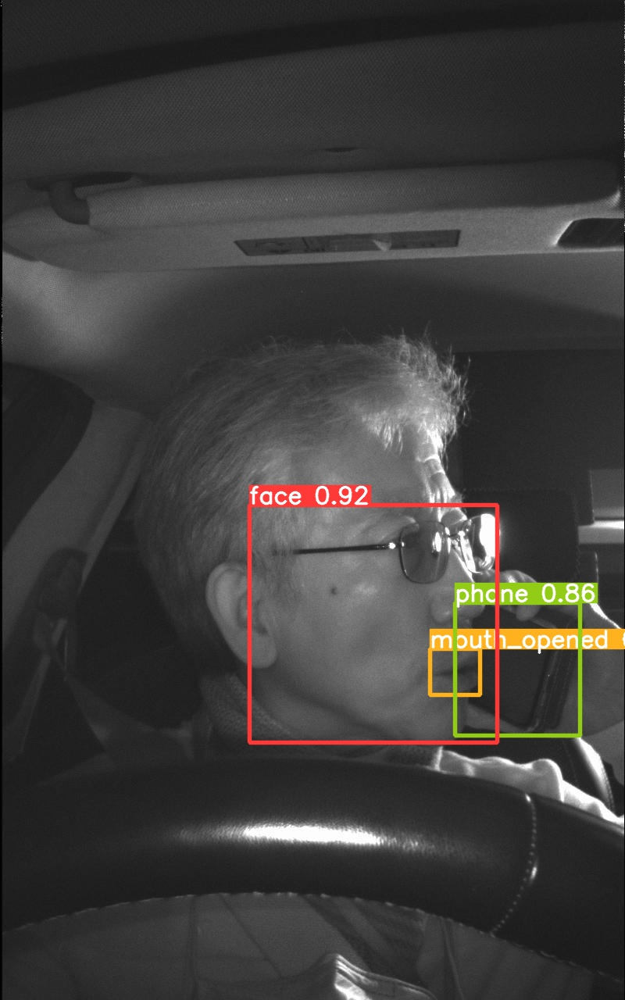

In [67]:
import glob
import random
from IPython.display import Image
image_name = random.choice(glob.glob('runs/detect/exp/*.jpg'))
display(Image(filename=image_name))

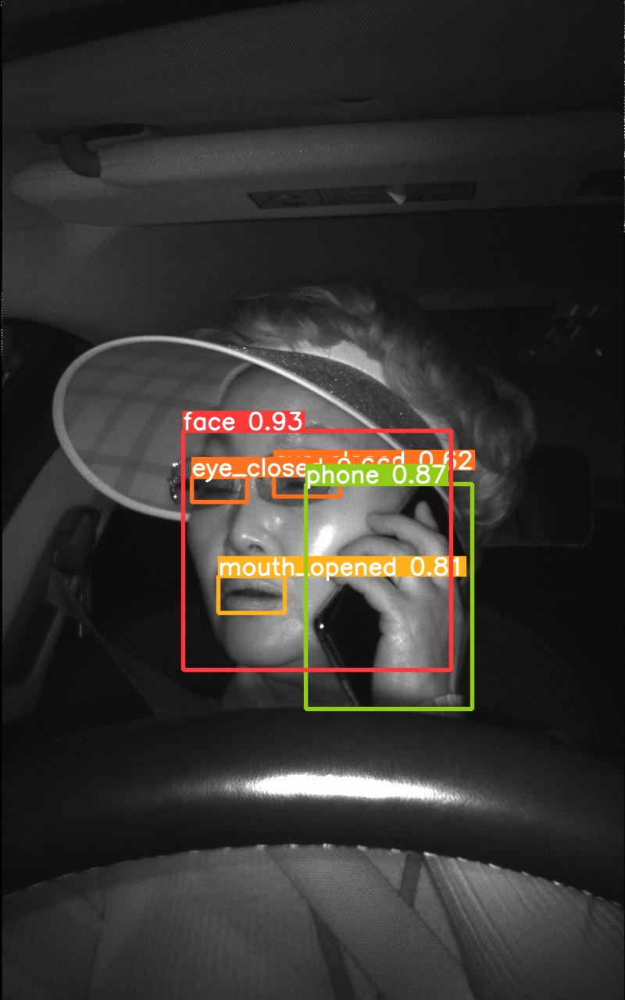

runs/detect/exp/image_09714093402545.jpg


In [ ]:
import glob
import random
from IPython.display import Image
image_name = random.choice(glob.glob('runs/detect/exp/*.jpg'))
display(Image(filename=image_name))
print(image_name)

In [13]:
!python detect.py --weights /content/drive/MyDrive/Code_States/Section4/driver/best2.pt --img 416 --conf 0.4 --source /content/drive/MyDrive/Code_States/Section4/train/images

스트리밍 출력 내용이 길어서 마지막 5000줄이 삭제되었습니다.
image 11413/16410 /content/drive/MyDrive/Code_States/Section4/train/images/image_70158585255377.jpg: 416x416 1 face, 2 eye_openeds, 1 cigar, Done. (0.006s)
image 11414/16410 /content/drive/MyDrive/Code_States/Section4/train/images/image_70175424045818.jpg: 416x416 1 face, 2 eye_openeds, 1 mouth_opened, 1 phone, Done. (0.006s)
image 11415/16410 /content/drive/MyDrive/Code_States/Section4/train/images/image_70178296655867.jpg: 416x416 1 face, 2 eye_openeds, 1 mouth_opened, 1 phone, Done. (0.006s)
image 11416/16410 /content/drive/MyDrive/Code_States/Section4/train/images/image_70178480767726.jpg: 416x416 1 face, 2 eye_openeds, 1 mouth_opened, 1 phone, Done. (0.006s)
image 11417/16410 /content/drive/MyDrive/Code_States/Section4/train/images/image_70180713667641.jpg: 416x416 1 face, 1 eye_closed, 1 mouth_closed, Done. (0.008s)
image 11418/16410 /content/drive/MyDrive/Code_States/Section4/train/images/image_70181318164373.jpg: 416x416 1 face, 2 eye_openeds

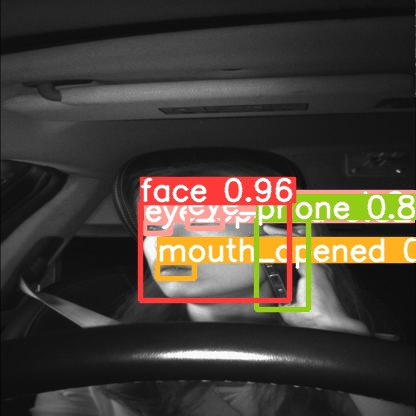

runs/detect/exp2/image_08001146061700.jpg


In [40]:
image_name = random.choice(glob.glob('runs/detect/exp2/*.jpg'))
display(Image(filename=image_name))
print(image_name)